In [1]:
import scanpy as sc
import multimil as mtm
import anndata as ad
import numpy as np
import random
import pandas as pd
import matplotlib.pyplot as plt
import scvi
from sklearn.metrics import classification_report, accuracy_score, precision_recall_curve, f1_score, confusion_matrix
import scipy.stats as st

sc.set_figure_params(dpi=100, frameon=False, facecolor=None, transparent=True)

[rank: 0] Global seed set to 0
/home/icb/zihe.zheng/miniconda3/envs/multimil2/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
%load_ext autoreload
%autoreload 2

## preprocess for prediction

In [4]:
adata = sc.read_h5ad('/lustre/groups/ml01/projects/2024_microglia_zihe.zheng/integrated_data/seaad_rosmap_integrated_rna.h5ad')
adata

AnnData object with n_obs × n_vars = 4171637 × 2000
    obs: 'sample_id', 'Neurotypical reference', 'Donor_ID', 'Organism', 'Brain Region', 'Sex', 'Gender', 'Age at Death', 'Race (choice=White)', 'Race (choice=Black/ African American)', 'Race (choice=Asian)', 'Race (choice=American Indian/ Alaska Native)', 'Race (choice=Native Hawaiian or Pacific Islander)', 'Race (choice=Unknown or unreported)', 'Race (choice=Other)', 'specify other race', 'Hispanic/Latino', 'Highest level of education', 'Years of education', 'PMI', 'Fresh Brain Weight', 'Brain pH', 'Overall AD neuropathological Change', 'Thal', 'Braak', 'CERAD score', 'Overall CAA Score', 'Highest Lewy Body Disease', 'Total Microinfarcts (not observed grossly)', 'Total microinfarcts in screening sections', 'Atherosclerosis', 'Arteriolosclerosis', 'LATE', 'Cognitive Status', 'Last CASI Score', 'Interval from last CASI in months', 'Last MMSE Score', 'Interval from last MMSE in months', 'Last MOCA Score', 'Interval from last MOCA in mon

In [5]:
adata.obs['APOE Genotype'].unique()

['2/2', '3/3', '3/4', '2/3', '4/4', '2/4', 'nan']
Categories (7, object): ['2/2', '2/3', '2/4', '3/3', '3/4', '4/4', 'nan']

In [6]:
adata.obs['apoe_genotype'].unique()

['nan', '33.0', '34.0', '23.0', '24.0', '44.0', '22.0']
Categories (7, object): ['22.0', '23.0', '24.0', '33.0', '34.0', '44.0', 'nan']

In [7]:
def get_apoe_label(row):
    val = row['APOE Genotype'] if row['APOE Genotype'] != 'nan' else row['apoe_genotype']
    if val == 'nan' or pd.isna(val):
        return np.nan
    count = str(val).count('4')
    return ['0', '1', '2'][count]

adata.obs['apoe_label'] = adata.obs.apply(get_apoe_label, axis=1)


In [8]:
adata.obs['apoe_label'].value_counts()

apoe_label
0    3011052
1     987585
2     171338
Name: count, dtype: int64

In [9]:
adata.obs[['APOE Genotype', 'apoe_genotype', 'apoe_label']]

,APOE Genotype,apoe_genotype,apoe_label
GGTGATTAGGTCACTT-L8TX_210722_01_H06-1153814299,2/2,nan,0
TTGAACGCAGGTGTGA-L8TX_210729_01_G12-1153814338,3/3,nan,0
GGGAGTAAGGCATTTC-L8TX_210107_01_H09-1142430361,3/3,nan,0
ACAGAAAGTATCGTGT-L8TX_210415_01_G01-1153814188,3/3,nan,0
TTGTTCAAGCGAGAAA-L8TX_210513_01_F11-1153814259,3/3,nan,0
...,...,...,...
1649660,nan,33.0,0
1649664,nan,23.0,0
1649668,nan,23.0,0
1649669,nan,33.0,0


In [10]:
adata.obs['Overall AD neuropathological Change'].value_counts()

Overall AD neuropathological Change
nan             1625707
High            1145596
Intermediate     690278
Low              388224
Not AD           321832
Name: count, dtype: int64

In [11]:
adata.obs['ceradsc'].value_counts()

ceradsc
nan    2549887
2.0     573601
1.0     476238
4.0     392016
3.0     179895
Name: count, dtype: int64

In [12]:
adata.obs['AD'] = np.where(
    (adata.obs['ceradsc'].isin(['3.0', '4.0'])) | (adata.obs['Overall AD neuropathological Change'].isin(['Not AD'])),
    'healthy',  # Value if condition is True
    'AD'  # Value if condition is False, adjust this as necessary
)

In [13]:
adata.obs[['ceradsc', 'Overall AD neuropathological Change', 'AD']]

,ceradsc,Overall AD neuropathological Change,AD
GGTGATTAGGTCACTT-L8TX_210722_01_H06-1153814299,nan,Intermediate,AD
TTGAACGCAGGTGTGA-L8TX_210729_01_G12-1153814338,nan,High,AD
GGGAGTAAGGCATTTC-L8TX_210107_01_H09-1142430361,nan,Intermediate,AD
ACAGAAAGTATCGTGT-L8TX_210415_01_G01-1153814188,nan,Low,AD
TTGTTCAAGCGAGAAA-L8TX_210513_01_F11-1153814259,nan,High,AD
...,...,...,...
1649660,2.0,nan,AD
1649664,1.0,nan,AD
1649668,1.0,nan,AD
1649669,2.0,nan,AD


In [ ]:
sc.pp.neighbors(adata, use_rep="X_multigrate")
sc.tl.umap(adata)

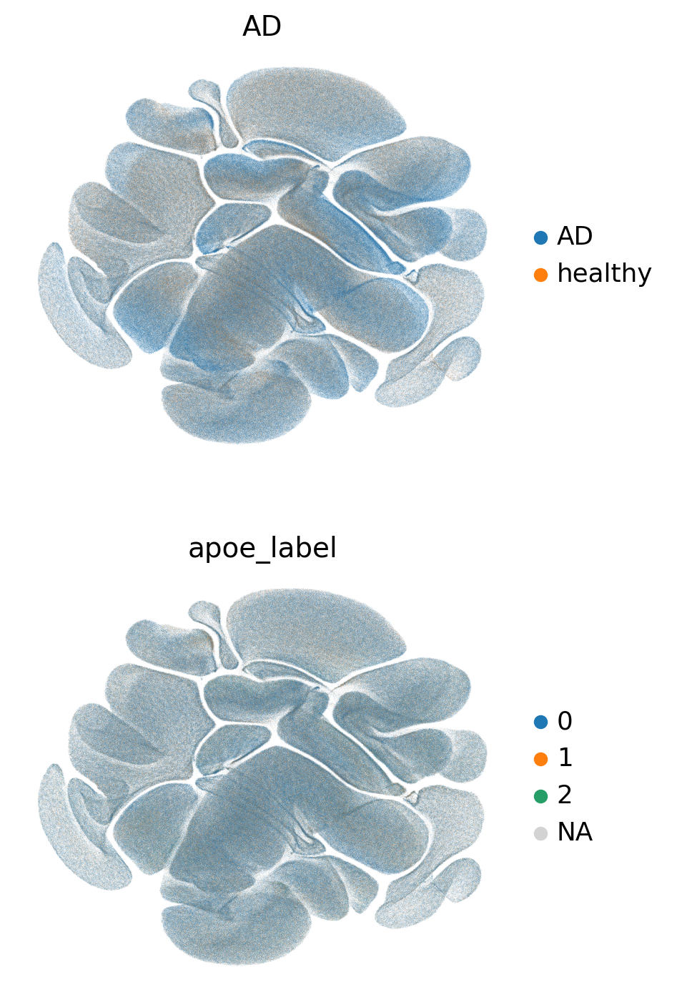

In [15]:
sc.pl.umap(adata, color = ['AD', 'apoe_label'], ncols = 1)

In [16]:
max(list(adata.obs.Donor_ID.value_counts()))

50582

In [17]:
# align cell type labels
subclass_to_broad = {
    'L5 IT': 'Excitatory',
    'L6 IT': 'Excitatory',
    'Pvalb': 'Inhibitory',
    'Microglia-PVM': 'Microglia',
    'Astrocyte': 'Astrocytes',
    'L4 IT': 'Excitatory',
    'L2/3 IT': 'Excitatory',
    'L5/6 NP': 'Excitatory',
    'Sst': 'Inhibitory',
    'Vip': 'Inhibitory',
    'L6 IT Car3': 'Excitatory',
    'Lamp5': 'Inhibitory',
    'Oligodendrocyte': 'Oligodendrocytes',
    'Lamp5 Lhx6': 'Inhibitory',
    'L6 CT': 'Excitatory',
    'Chandelier': 'Inhibitory',
    'L6b': 'Excitatory',
    'OPC': 'OPCs',
    'Sncg': 'Inhibitory',
    'Endothelial': 'Endothelial',
    'Pax6': 'Inhibitory',  
    'VLMC': 'Endothelial',  
    'Sst Chodl': 'Inhibitory',
    'L5 ET': 'Excitatory'
}

# Map to new column
adata.obs['Subclass_aligned'] = adata.obs['Subclass'].map(subclass_to_broad)

In [18]:
adata.obs["subset"] = adata.obs["subset"].cat.rename_categories({"CUX2+": "Excitatory"})

In [19]:
adata.obs['Subclass_aligned'] = adata.obs['Subclass_aligned'].fillna(adata.obs['subset'])

In [20]:
adata.obs[['msex', 'Sex', 'Gender']]

,msex,Sex,Gender
GGTGATTAGGTCACTT-L8TX_210722_01_H06-1153814299,nan,Female,Female
TTGAACGCAGGTGTGA-L8TX_210729_01_G12-1153814338,nan,Female,Female
GGGAGTAAGGCATTTC-L8TX_210107_01_H09-1142430361,nan,Female,Female
ACAGAAAGTATCGTGT-L8TX_210415_01_G01-1153814188,nan,Male,Male
TTGTTCAAGCGAGAAA-L8TX_210513_01_F11-1153814259,nan,Male,Male
...,...,...,...
1649660,1.0,nan,nan
1649664,0.0,nan,nan
1649668,0.0,nan,nan
1649669,0.0,nan,nan


In [21]:
adata.obs['Sex']

GGTGATTAGGTCACTT-L8TX_210722_01_H06-1153814299    Female
TTGAACGCAGGTGTGA-L8TX_210729_01_G12-1153814338    Female
GGGAGTAAGGCATTTC-L8TX_210107_01_H09-1142430361    Female
ACAGAAAGTATCGTGT-L8TX_210415_01_G01-1153814188      Male
TTGTTCAAGCGAGAAA-L8TX_210513_01_F11-1153814259      Male
                                                   ...  
1649660                                              nan
1649664                                              nan
1649668                                              nan
1649669                                              nan
1649671                                              nan
Name: Sex, Length: 4171637, dtype: category
Categories (3, object): ['Female', 'Male', 'nan']

In [22]:
adata.obs['Gender']

GGTGATTAGGTCACTT-L8TX_210722_01_H06-1153814299    Female
TTGAACGCAGGTGTGA-L8TX_210729_01_G12-1153814338    Female
GGGAGTAAGGCATTTC-L8TX_210107_01_H09-1142430361    Female
ACAGAAAGTATCGTGT-L8TX_210415_01_G01-1153814188      Male
TTGTTCAAGCGAGAAA-L8TX_210513_01_F11-1153814259      Male
                                                   ...  
1649660                                              nan
1649664                                              nan
1649668                                              nan
1649669                                              nan
1649671                                              nan
Name: Gender, Length: 4171637, dtype: category
Categories (3, object): ['Female', 'Male', 'nan']

In [23]:
adata.write_h5ad('/lustre/groups/ml01/projects/2024_microglia_zihe.zheng/integrated_data/seaad_rosmap_integrated_rna_harmonized.h5ad')

## predictions apoe

In [4]:
adata = sc.read_h5ad('/lustre/groups/ml01/projects/2024_microglia_zihe.zheng/integrated_data/seaad_rosmap_integrated_rna_harmonized_apoe.h5ad')

In [5]:
adata

AnnData object with n_obs × n_vars = 4169975 × 16
    obs: 'sample_id', 'Neurotypical reference', 'Donor_ID', 'Organism', 'Brain Region', 'Sex', 'Gender', 'Age at Death', 'Race (choice=White)', 'Race (choice=Black/ African American)', 'Race (choice=Asian)', 'Race (choice=American Indian/ Alaska Native)', 'Race (choice=Native Hawaiian or Pacific Islander)', 'Race (choice=Unknown or unreported)', 'Race (choice=Other)', 'specify other race', 'Hispanic/Latino', 'Highest level of education', 'Years of education', 'PMI', 'Fresh Brain Weight', 'Brain pH', 'Overall AD neuropathological Change', 'Thal', 'Braak', 'CERAD score', 'Overall CAA Score', 'Highest Lewy Body Disease', 'Total Microinfarcts (not observed grossly)', 'Total microinfarcts in screening sections', 'Atherosclerosis', 'Arteriolosclerosis', 'LATE', 'Cognitive Status', 'Last CASI Score', 'Interval from last CASI in months', 'Last MMSE Score', 'Interval from last MMSE in months', 'Last MOCA Score', 'Interval from last MOCA in month

In [6]:
adata.obs['apoe_label'].value_counts()

apoe_label
0    3011052
1     987585
2     171338
Name: count, dtype: int64

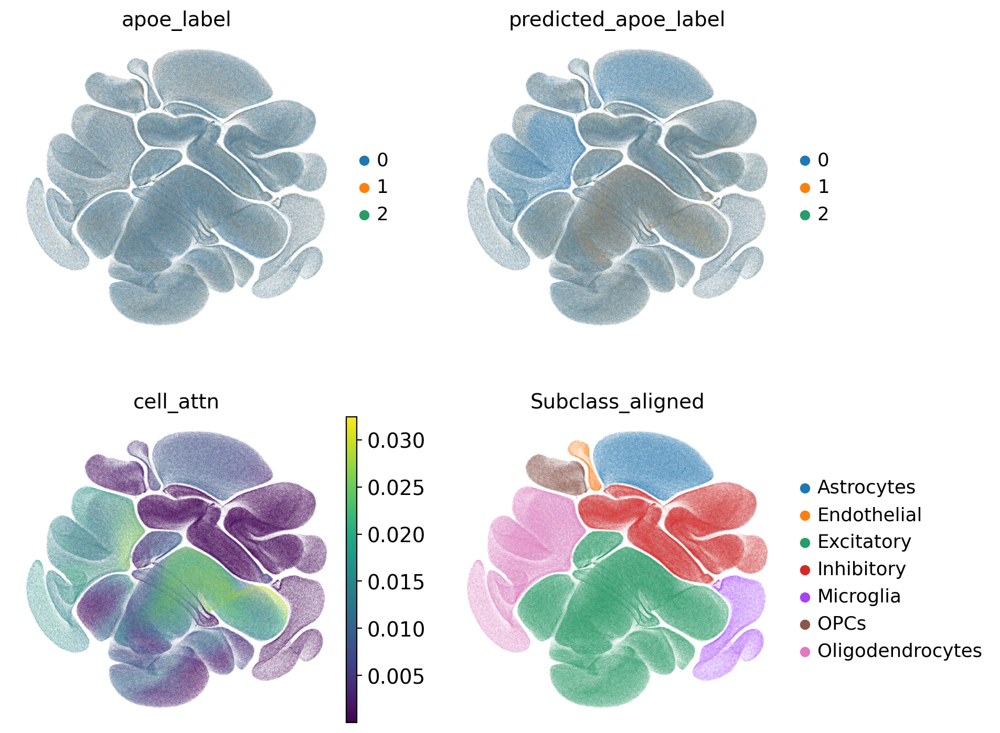

In [7]:
sc.pl.umap(adata, color=["apoe_label", "predicted_apoe_label", "cell_attn", 'Subclass_aligned'], ncols=2, frameon=False, vmax="p99")


## predictions disease

In [8]:
adata = sc.read_h5ad('/lustre/groups/ml01/projects/2024_microglia_zihe.zheng/integrated_data/seaad_rosmap_integrated_rna_harmonized_ad.h5ad')

In [9]:
adata.obs['AD'].value_counts()

AD
AD         3277894
healthy     893743
Name: count, dtype: int64

In [13]:
adata

AnnData object with n_obs × n_vars = 4171637 × 16
    obs: 'sample_id', 'Neurotypical reference', 'Donor_ID', 'Organism', 'Brain Region', 'Sex', 'Gender', 'Age at Death', 'Race (choice=White)', 'Race (choice=Black/ African American)', 'Race (choice=Asian)', 'Race (choice=American Indian/ Alaska Native)', 'Race (choice=Native Hawaiian or Pacific Islander)', 'Race (choice=Unknown or unreported)', 'Race (choice=Other)', 'specify other race', 'Hispanic/Latino', 'Highest level of education', 'Years of education', 'PMI', 'Fresh Brain Weight', 'Brain pH', 'Overall AD neuropathological Change', 'Thal', 'Braak', 'CERAD score', 'Overall CAA Score', 'Highest Lewy Body Disease', 'Total Microinfarcts (not observed grossly)', 'Total microinfarcts in screening sections', 'Atherosclerosis', 'Arteriolosclerosis', 'LATE', 'Cognitive Status', 'Last CASI Score', 'Interval from last CASI in months', 'Last MMSE Score', 'Interval from last MMSE in months', 'Last MOCA Score', 'Interval from last MOCA in month

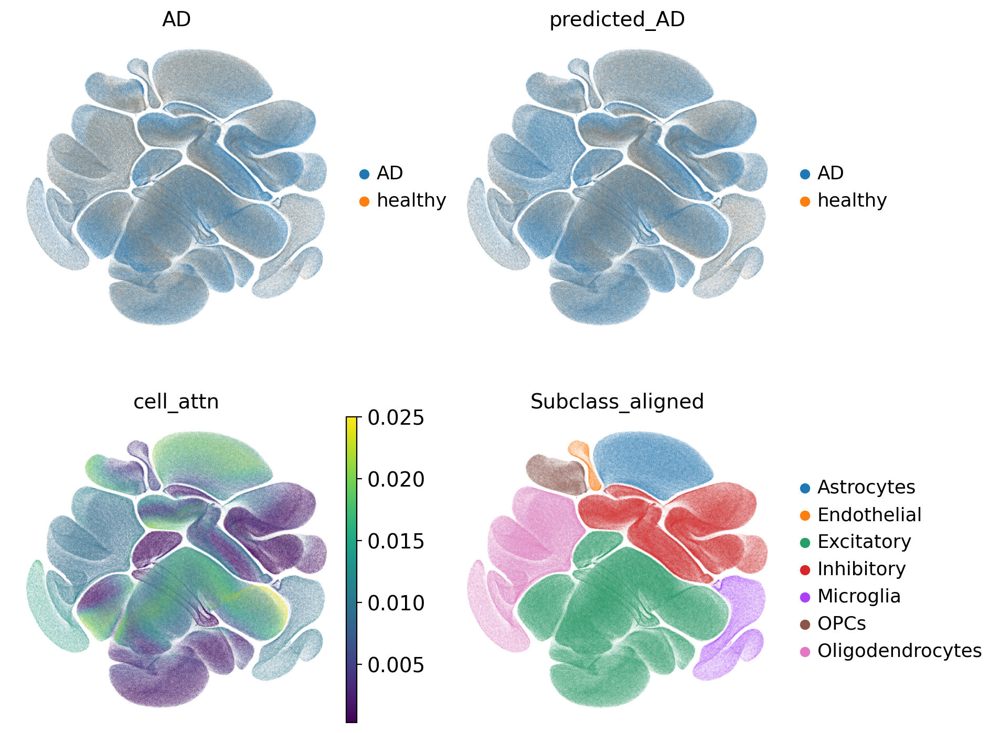

In [10]:
sc.pl.umap(adata, color=["AD", "predicted_AD", "cell_attn", 'Subclass_aligned'], ncols=2, frameon=False, vmax="p99")


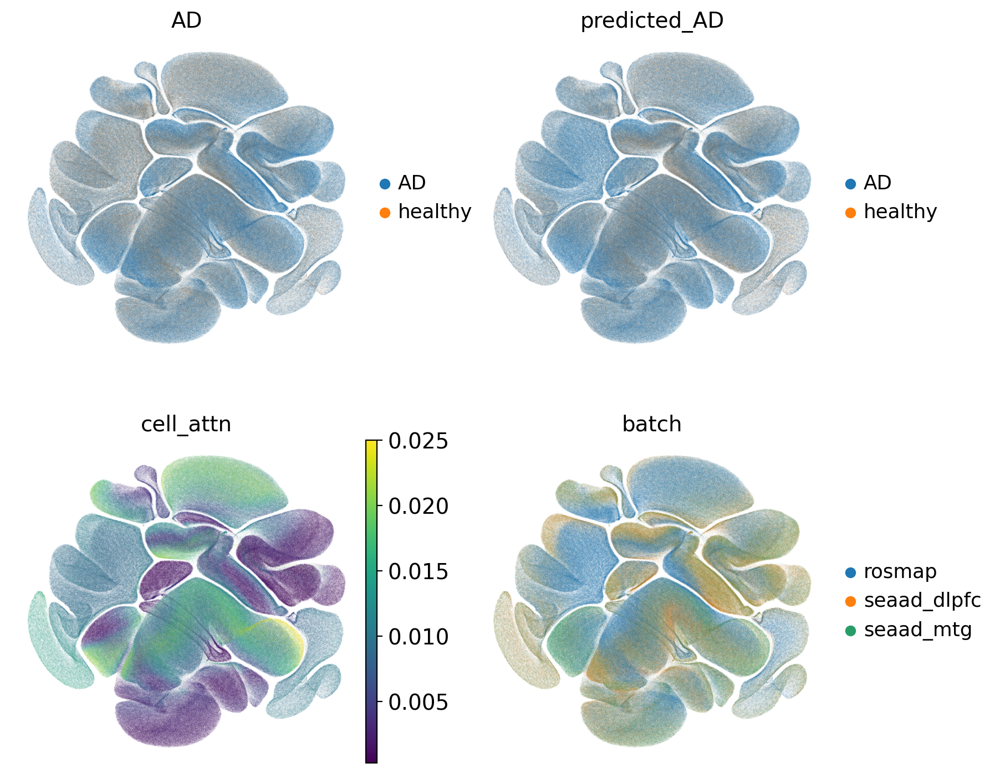

In [11]:
sc.pl.umap(adata, color=["AD", "predicted_AD", "cell_attn", 'batch'], ncols=2, frameon=False, vmax="p99")


In [16]:
df

,cell_attn,AD,batch,batch_group,AD_status
CTACCCAGTCTGATAC-L8TX_210305_01_G02-1153814153,0.000879,healthy,seaad_mtg,non-ROSMAP,Healthy
GTGAGCCCACGCGCTA-L8TX_210617_01_B12-1113634357,0.018768,healthy,seaad_dlpfc,non-ROSMAP,Healthy
CTAGACACAATTGAAG-L8TX_210617_01_B12-1113634357,0.019813,healthy,seaad_dlpfc,non-ROSMAP,Healthy
GACTCTCTCAAGGCTT-L8TX_210305_01_G02-1153814153,0.021097,healthy,seaad_mtg,non-ROSMAP,Healthy
GTGTGATAGGACAGCT-L8TX_210513_01_A10-1153814239,0.002158,healthy,seaad_mtg,non-ROSMAP,Healthy
...,...,...,...,...,...
269868,0.004611,AD,rosmap,ROSMAP,Healthy
269870,0.002201,AD,rosmap,ROSMAP,Healthy
269871,0.001814,AD,rosmap,ROSMAP,Healthy
269851,0.003276,AD,rosmap,ROSMAP,Healthy


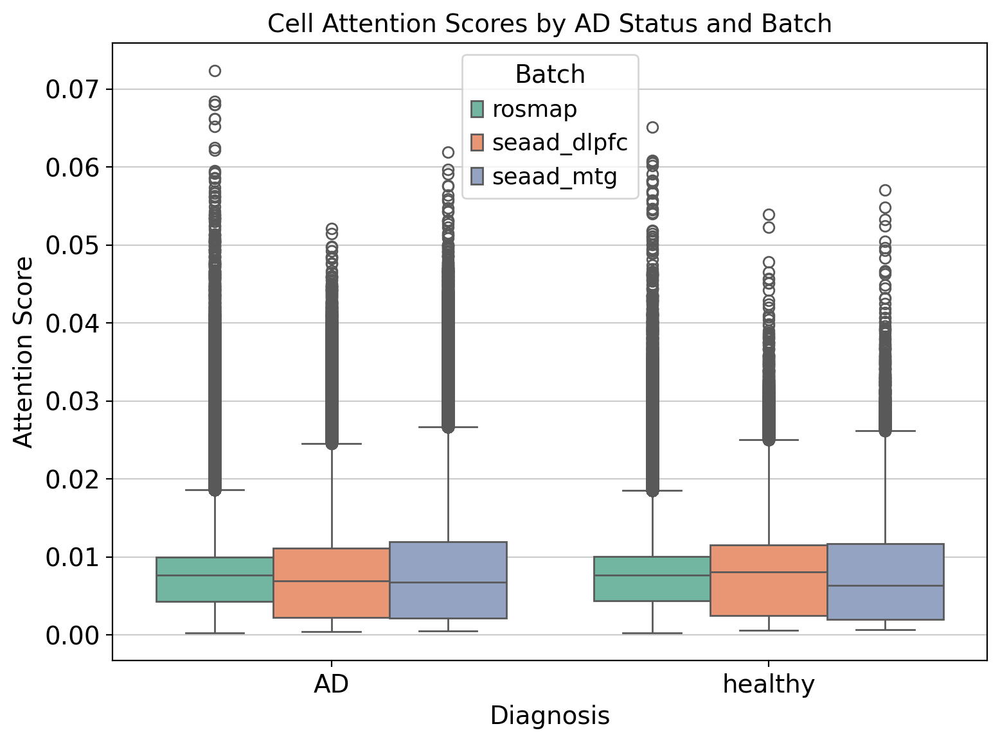

In [20]:
df = adata.obs[['cell_attn', 'AD', 'batch']].copy()

plt.figure(figsize=(8, 6))
sns.boxplot(data=df, x='AD', y='cell_attn', hue='batch', palette='Set2')

plt.title('Cell Attention Scores by AD Status and Batch')
plt.ylabel('Attention Score')
plt.xlabel('Diagnosis')
plt.legend(title='Batch')
plt.tight_layout()
plt.show()

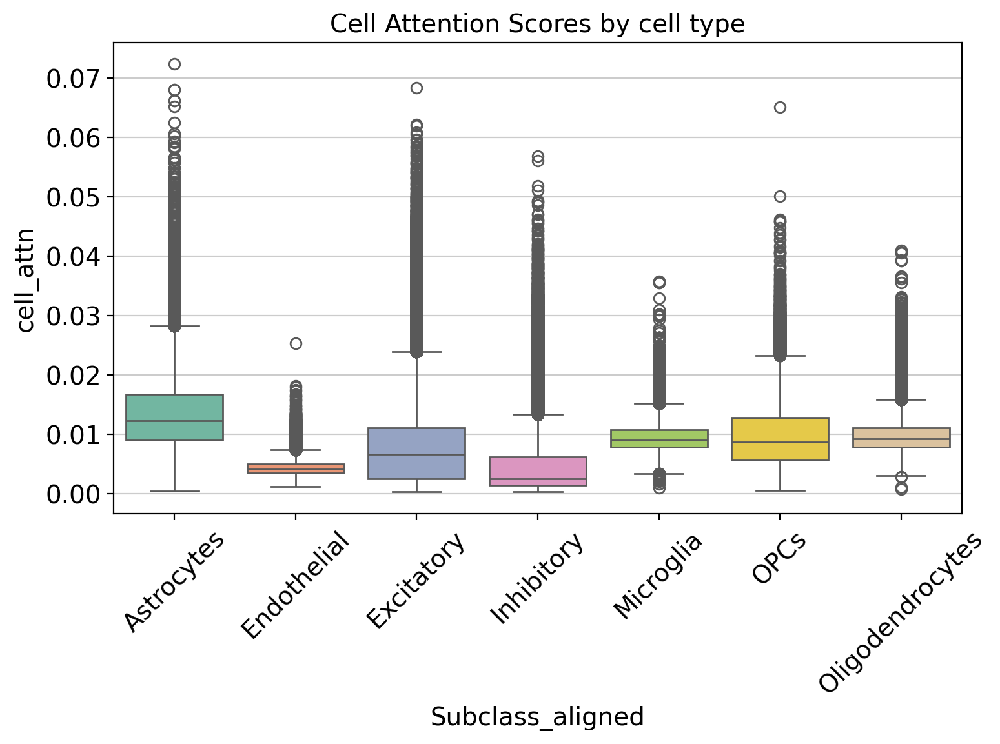

In [22]:
df = adata.obs[['cell_attn', 'Subclass_aligned']].copy()

plt.figure(figsize=(8, 6))
sns.boxplot(data=df, x='Subclass_aligned', y='cell_attn', palette='Set2')

plt.title('Cell Attention Scores by cell type')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()